# Segmentation Test for Fusion

pycodex version 0.1.3

In [1]:
import os

import tensorflow as tf
from pycodex.data_process import crop
from pycodex import io, metadata, markerim, utils, visualization as vis
from tifffile import tifffile

# GPU setup: Specify visible GPU(s) and allow memory growth
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

try:
    gpus = tf.config.list_physical_devices("GPU")
    if gpus:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"Using GPU(s): {[gpu.name for gpu in gpus]}")
    else:
        print("No GPU detected, using CPU.")
except RuntimeError as e:
    print(f"GPU setup failed: {e}")


Using GPU(s): ['/physical_device:GPU:0']


# 00. Data Overview

In [2]:
marker_dir = "./data/"
metadata_dict = io.organize_metadata_fusion(marker_dir)

unique_markers, _, _, _ = metadata.summary_markers(metadata_dict)
utils.display_items(unique_markers)
utils.display_items(list(metadata_dict.keys()))

Summary of Markers:
- Total unique markers: 10
- Unique markers: 10 ['CD15', 'CD31', 'CD3e', 'CD68', 'DAPI', 'E-cadherin', 'HLA-1', 'HLA-DR', 'Vimentin', 'a-SMA']
- Blank markers: 0 []
- Markers duplicated in some regions: 0 []
- Markers missing in some regions: 0 []


,1,2,3,4,5,6,7,8,9,10
0,CD15,CD31,CD3e,CD68,DAPI,E-cadherin,HLA-1,HLA-DR,Vimentin,a-SMA


,1
0,reg001


# 01. Crop subregion

100%|██████████| 1/1 [00:00<00:00, 618.54it/s]


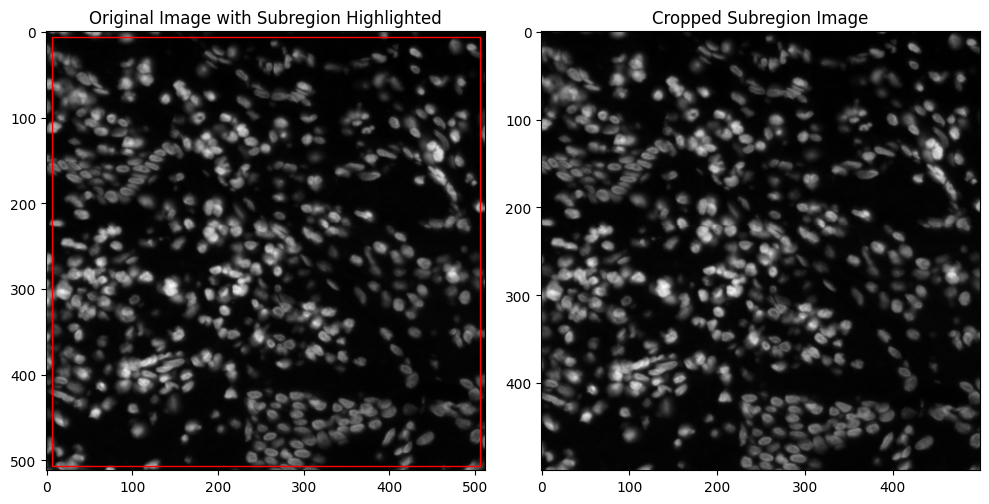

In [3]:
# paramters ^ #####
region = "reg001"
marker = "DAPI"
x_mid, y_mid = 256, 256
length = 500
# paramters $ #####

marker_dict = metadata.organize_marker_dict(metadata_dict, region, [marker])
im = marker_dict[marker]
vis.plot_cropped_subregion(im, x_mid=x_mid, y_mid=y_mid, length=length, figsize=(10, 10), cmap="gray")


# 02. Segmentation

In [4]:
# parameter ^ #####
boundary_broad = ["HLA-1", "CD31", "E-cadherin", "Vimentin"]
boundary_restricted = ["CD68", "CD3e", "HLA-DR", "CD15"]
internal_nuclear = ["DAPI"]
internal_cytoplasmic = ["a-SMA"]
# parameter $ #####

marker_list = boundary_broad + boundary_restricted + internal_nuclear + internal_cytoplasmic
marker_dict = metadata.organize_marker_dict(metadata_dict, region, marker_list)
marker_dict = markerim.subset_subregion(
    marker_dict, int(x_mid - length / 2), int(x_mid + length / 2), int(y_mid - length / 2), int(y_mid + length / 2)
)


100%|██████████| 10/10 [00:00<00:00, 207.18it/s]


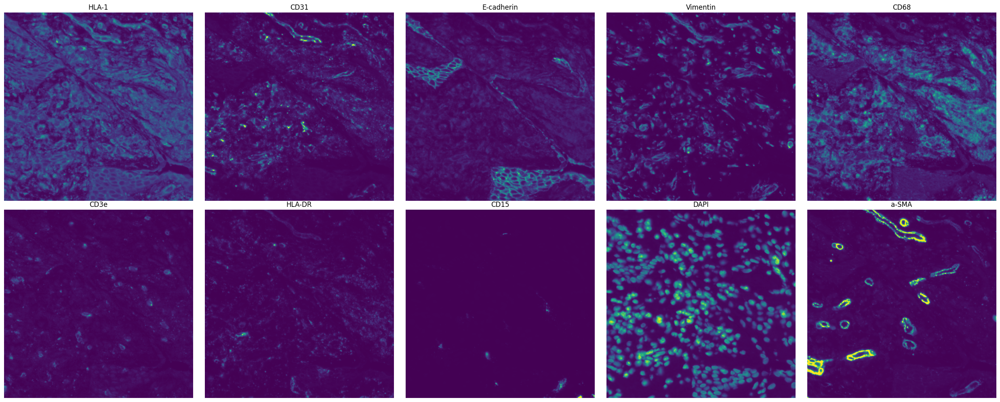

In [5]:
vis.plot_scale_marker_sum(
    [[marker] for marker in marker_list],
    marker_list,
    marker_dict,
    scale=True,
    ncol=5,
    vmax=1,
    figsize=(5, 5),
)


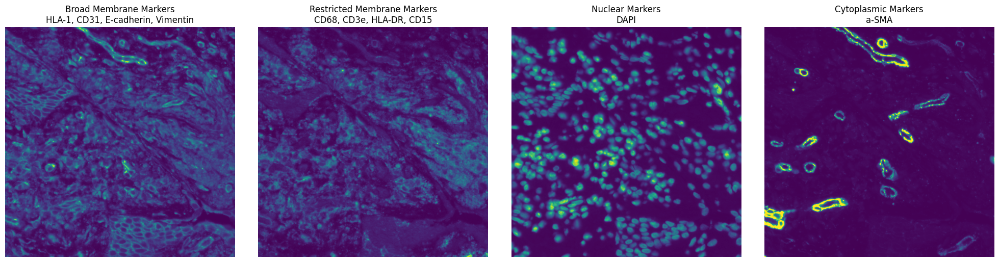

In [6]:
# marker_lists = [boundary_broad, boundary_restricted, internal_nuclear, ["Vimentin"]]
marker_lists = [
    boundary_broad,
    boundary_restricted,
    internal_nuclear,
    internal_cytoplasmic,
]
title_list = [
    "Broad Membrane Markers",
    "Restricted Membrane Markers",
    "Nuclear Markers",
    "Cytoplasmic Markers",
]
title_list_markers = [", ".join(marker_list) for marker_list in marker_lists]
title_list = [title + "\n" + title_marker for title, title_marker in zip(title_list, title_list_markers)]

vis.plot_scale_marker_sum(
    marker_lists,
    title_list,
    marker_dict,
    scale=True,
    ncol=4,
    figsize=(5, 5),
)


## 02-01. Test 1
- boundary: broad membrane markers
- internal: nuclear + cytoplasmic markers
- parameter: default

In [7]:
# parameter ^ #####
boundary_markers = boundary_broad
internal_markers = internal_nuclear + internal_cytoplasmic
pixel_size_um = 0.5068164319979996
scale = True
maxima_threshold = 0.075
interior_threshold = 0.20
# parameter $ #####

segmentation_mask, rgb_image, overlay = markerim.segmentation_mesmer(
    marker_dict,
    boundary_markers,
    internal_markers,
    pixel_size_um,
    scale,
    maxima_threshold,
    interior_threshold,
)


2024-10-23 01:23:30.756685: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-23 01:23:31.231683: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5419 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:b1:00.0, compute capability: 8.6


2024-10-23 01:23:40.700040: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8100
2024-10-23 01:23:41.401865: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-10-23 01:23:42.053632: W tensorflow/core/common_runtime/bfc_allocator.cc:343] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the threshold of the available device memory and re-allocation may incur great performance overhead. You may try smaller batch sizes to observe the performance impact. Set TF_ENABLE_GPU_GARBAGE_COLLECTION=false if you'd like to disable this feature.


boundary: ['HLA-1', 'CD31', 'E-cadherin', 'Vimentin']
internal: ['DAPI', 'a-SMA']


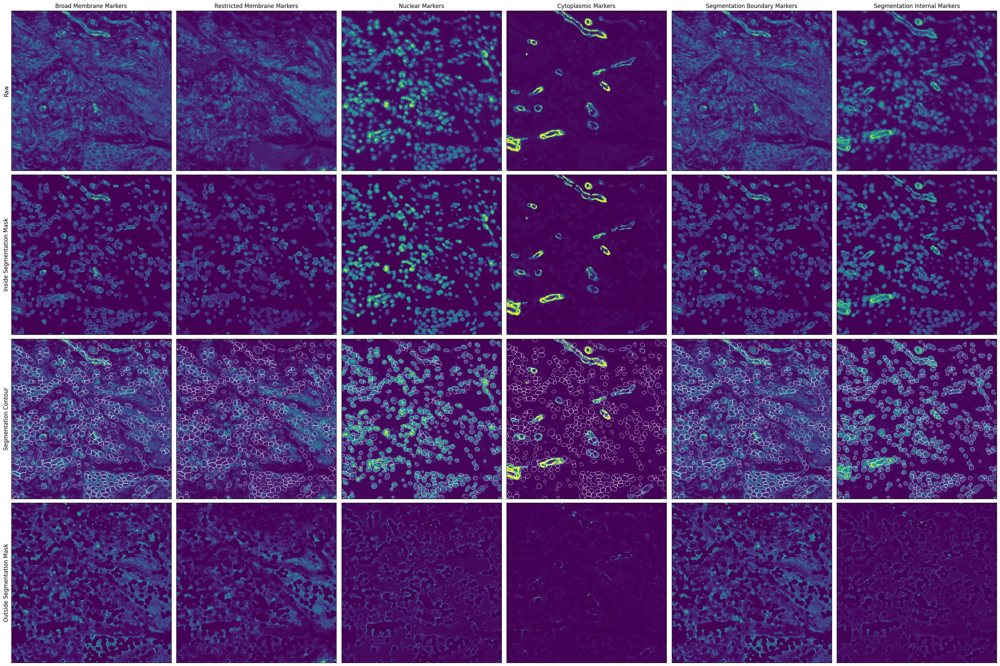

In [8]:
print(f"boundary: {boundary_markers}")
print(f"internal: {internal_markers}")

vis.plot_scale_marker_sum_segmentation(
    [
        boundary_broad,
        boundary_restricted,
        internal_nuclear,
        internal_cytoplasmic,
        boundary_markers,
        internal_markers,
    ],
    [
        "Broad Membrane Markers",
        "Restricted Membrane Markers",
        "Nuclear Markers",
        "Cytoplasmic Markers",
        "Segmentation Boundary Markers",
        "Segmentation Internal Markers",
    ],
    marker_dict,
    segmentation_mask,
    overlay,
    scale=True,
    alpha=0.75,
    figsize=(5, 5),
)
